# TD9


## idée de plot

In [ ]:
surface acheté / surface utilisé
nbr lot sur une carte
surface / valeur foncière


## 1-Importation des différents modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#!pip install pygal_maps_fr
#import pygal_maps_fr
#!pip install cairosvg
!pip install plotly
!pip install folium
import json
import folium
import plotly.express as px
geo = json.load(open("departements.geojson"))

création de la dataframe et modification des noms des colonnes pour faciliter l'utilisation

In [2]:
df = pd.read_csv('valeursfoncieres-2020.txt',sep='|' ) #creation de la DataFrame
df.drop(df.iloc[:, :7], inplace = True, axis = 1) #on remarque que les 7 premières colonnes ne servent à rien il n'y a pas de données.
df.columns = [c.replace('/', '_') for c in df.columns] #on remplace les '/' pour pouvoir appeler la colonne plus facilement.
df.columns = [c.replace(' ', '_') for c in df.columns] #pareil avec les espaces 
df['Valeur_fonciere'] = df['Valeur_fonciere'].replace({',' : '.'},regex=True) #on remplace les ',' dans la colonne valeur fonciere pour pouvoir la convertir en float
df['Valeur_fonciere'] = df['Valeur_fonciere'].replace({'NaN' : '0'},regex=True)
df.Valeur_fonciere = df.Valeur_fonciere.apply(lambda x :float(x)) #conversion en float
df.Code_departement = df.Code_departement.apply(lambda x :str(x)) 

C:\Users\Azizm\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (14,18,23,24,26,28,31,33,41) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


# carte de France

In [3]:
paris = folium.Map(location = [48.856578, 2.351828], zoom_start = 5)
paris

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459560 entries, 0 to 2459559
Data columns (total 36 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   No_disposition              int64  
 1   Date_mutation               object 
 2   Nature_mutation             object 
 3   Valeur_fonciere             float64
 4   No_voie                     float64
 5   B_T_Q                       object 
 6   Type_de_voie                object 
 7   Code_voie                   object 
 8   Voie                        object 
 9   Code_postal                 float64
 10  Commune                     object 
 11  Code_departement            object 
 12  Code_commune                int64  
 13  Prefixe_de_section          float64
 14  Section                     object 
 15  No_plan                     int64  
 16  No_Volume                   object 
 17  1er_lot                     object 
 18  Surface_Carrez_du_1er_lot   object 
 19  2eme_lot             

In [34]:
geo.keys()
geo["type"]
len(geo["features"])
geo["features"][0].keys()
geo["features"][0]['type']
geo["features"][0]['properties']

{'code': '02', 'nom': 'Aisne'}

In [4]:
df_departement = df.groupby(["Code_departement"]).count().reset_index()
df_departement.head(10)

,Code_departement,No_disposition,Date_mutation,Nature_mutation,Valeur_fonciere,No_voie,B_T_Q,Type_de_voie,Code_voie,Voie,...,Surface_Carrez_du_5eme_lot,Nombre_de_lots,Code_type_local,Type_local,Identifiant_local,Surface_reelle_bati,Nombre_pieces_principales,Nature_culture,Nature_culture_speciale,Surface_terrain
0,1,28478,28478,28478,27781,12267,759,11561,28222,28222,...,1,28478,12149,12149,0,12120,12120,21198,475,21198
1,10,11879,11879,11879,11661,6278,822,6339,11859,11858,...,6,11879,5909,5909,0,5899,5899,9516,595,9516
2,11,26953,26953,26953,26914,12217,908,11086,26859,26858,...,1,26953,11832,11832,0,11820,11820,22213,1156,22213
3,12,1888,1888,1888,1885,768,67,550,1882,1882,...,0,1888,722,722,0,715,715,1595,277,1595
4,13,49004,49004,49004,47323,36722,2505,37249,47461,47461,...,9,49004,32810,32810,0,32786,32786,18486,1282,18486
5,14,12356,12356,12356,12320,8753,363,7902,12282,12282,...,3,12356,8172,8172,0,8162,8162,8207,279,8207
6,15,4871,4871,4871,4859,1604,94,1127,4865,4865,...,1,4871,1519,1519,0,1519,1519,4423,262,4423
7,16,27702,27702,27702,27524,9282,493,8092,27697,27695,...,0,27702,8564,8564,0,8547,8547,26520,676,26520
8,17,27299,27299,27299,27191,13711,1259,14075,27160,27160,...,0,27299,12344,12344,0,12339,12339,23183,709,23183
9,18,19445,19445,19445,19354,9183,934,8266,19441,19439,...,4,19445,8396,8396,0,8378,8378,17897,511,17897


In [18]:
df.groupby(['Code_departement']).No_disposition.count()

Code_departement
1      28478
10     11879
11     26953
12      1888
13     49004
       ...  
95     46746
971     1254
972     2909
973     3295
974     7273
Name: No_disposition, Length: 97, dtype: int64

In [10]:
dfd = df.groupby(['Code_departement']).sum().reset_index()
dfd["Surface_terrain"] = dfd["Surface_terrain"]/100000
dfd["Surface_reelle_bati"] = dfd["Surface_reelle_bati"]/10000
dfd["Valeur_fonciere"] = dfd["Valeur_fonciere"]/1000000
dfd.head(10)

,Code_departement,No_disposition,Valeur_fonciere,No_voie,Code_postal,Code_commune,Prefixe_de_section,No_plan,4eme_lot,5eme_lot,Nombre_de_lots,Code_type_local,Identifiant_local,Surface_reelle_bati,Nombre_pieces_principales,Surface_terrain
0,1,31833,13665.308522,11759139.0,38425200.0,6137678,288124.0,17286890,9261.0,6256.0,8814,23724.0,0.0,120.5383,32297.0,485.24793
1,10,13658,1918.586148,1285468.0,121474620.0,3034128,39828.0,4266704,1094.0,283.0,3128,11340.0,0.0,55.9896,15334.0,301.21166
2,11,28441,4328.982766,9341321.0,303443100.0,5640346,23170.0,11220431,389.0,208.0,5230,21133.0,0.0,96.6430,30709.0,697.68864
3,12,2055,288.207312,1563093.0,23255300.0,301834,10947.0,861022,60.0,88.0,366,1424.0,0.0,5.5478,1668.0,59.97740
4,13,50695,35622.010618,54291111.0,628374676.0,5724566,17810316.0,11997349,31357.0,26391.0,36640,71704.0,0.0,228.2023,69323.0,317.98038
5,14,12913,3871.806011,16203223.0,176891764.0,5303511,629529.0,3140413,1478.0,504.0,5059,15181.0,0.0,63.4164,22166.0,326.73695
6,15,5559,533.061673,3118581.0,74495220.0,602818,31713.0,1644380,173.0,22.0,589,2778.0,0.0,15.3335,4019.0,211.79762
7,16,32864,4384.690976,8998711.0,451448920.0,5048607,463476.0,12853477,420.0,87.0,1289,13157.0,0.0,97.2291,26994.0,759.73659
8,17,28814,5423.174060,7312982.0,470855552.0,7095749,53866.0,12665870,545.0,240.0,4796,20302.0,0.0,126.5121,35492.0,515.27883
9,18,20795,4953.839538,3482009.0,354708750.0,2684882,0.0,6330169,1351.0,810.0,2164,14423.0,0.0,77.9886,23315.0,1010.55128


In [26]:
dfd.info

<bound method DataFrame.info of    Code_departement  No_disposition  Valeur_fonciere     No_voie  \
0                 1           31833     1.366531e+10  11759139.0   
1                10           13658     1.918586e+09   1285468.0   
2                11           28441     4.328983e+09   9341321.0   
3                12            2055     2.882073e+08   1563093.0   
4                13           50695     3.562201e+10  54291111.0   
..              ...             ...              ...         ...   
92               95           48760     3.567059e+11  19822484.0   
93              971            1322     2.024633e+09   2048815.0   
94              972            3014     4.697442e+09   8413534.0   
95              973            3364     5.301502e+09   2676769.0   
96              974            7838     8.788098e+09   1340541.0   

     Code_postal  Code_commune  Prefixe_de_section   No_plan  4eme_lot  \
0   3.842520e+07       6137678            288124.0  17286890    9261.0   
1  

In [6]:
france = folium.Map(location = [48.856578, 2.351828], zoom_start = 5)
france.choropleth(geo, key_on = "feature.properties.code",
                 data = dfd, columns = ["Code_departement", "Surface_terrain"],
                 fill_color = "Spectral"
                )
france

C:\Users\Azizm\anaconda3\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [7]:
france = folium.Map(location = [48.856578, 2.351828], zoom_start = 5)
france.choropleth(geo, key_on = "feature.properties.code",
                 data = dfd, columns = ["Code_departement", "Surface_reelle_bati"],
                 fill_color = "Spectral"
                )
france

In [11]:
france = folium.Map(location = [48.856578, 2.351828], zoom_start = 5)
france.choropleth(geo, key_on = "feature.properties.code",
                 data = dfd, columns = ["Code_departement", "Valeur_fonciere"],
                 fill_color = "Spectral"
                )
france

C:\Users\Azizm\anaconda3\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [7]:
paris = folium.Map(location = [48.856578, 2.351828], zoom_start = 5)
folium.Choropleth(
    geo_data=geo,
    name="choropleth",
    data=df,
    columns=["Code_departement", "Valeur_fonciere"],
    key_on="feature.properties.code",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Unemployment Rate (%)",
).add_to(paris)

folium.LayerControl().add_to(paris)

paris

In [41]:
df.Code_departement.unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '2A', '2B', '30', '31', '32', '33',
       '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44',
       '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55',
       '56', '58', '59', '60', '61', '62', '63', '64', '65', '66', '69',
       '70', '71', '72', '73', '74', '76', '77', '78', '79', '80', '81',
       '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92',
       '93', '94', '95', '971', '972', '973', '974', '75'], dtype=object)

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2459560 entries, 0 to 2459559
Data columns (total 36 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   No_disposition              int64  
 1   Date_mutation               object 
 2   Nature_mutation             object 
 3   Valeur_fonciere             float64
 4   No_voie                     float64
 5   B_T_Q                       object 
 6   Type_de_voie                object 
 7   Code_voie                   object 
 8   Voie                        object 
 9   Code_postal                 float64
 10  Commune                     object 
 11  Code_departement            object 
 12  Code_commune                int64  
 13  Prefixe_de_section          float64
 14  Section                     object 
 15  No_plan                     int64  
 16  No_Volume                   object 
 17  1er_lot                     object 
 18  Surface_Carrez_du_1er_lot   object 
 19  2eme_lot             

In [5]:
france = folium.Map(location = [46.603354, 1.8883335], zoom_start = 6)
france.choropleth(geo, key_on = "feature.properties.nom",
                 data = dfg, columns = ["","Surface_reelle_bati"]
                 ,fill_color = "Spectral")
france

NameError: name 'geo' is not defined

In [22]:
departement = f"{'https://france-geojson.gregoiredavid.fr/repo/departements.geojson'}"
donnee = df.groupby(['Code_departement']).sum()
folium.Choropleth(
    geo_data=departement,
    name="choropleth",
    data=donnee,
    columns=["No_disposition","Valeur_fonciere"],
    key_on="geometry",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="",
).add_to(paris)

paris

TypeError: unhashable type: 'dict'

In [49]:
df.groupby(['Code_departement']).sum()

,No_disposition,Valeur_fonciere,No_voie,Code_postal,Code_commune,Prefixe_de_section,No_plan,4eme_lot,5eme_lot,Nombre_de_lots,Code_type_local,Identifiant_local,Surface_reelle_bati,Nombre_pieces_principales,Surface_terrain
Code_departement,,,,,,,,,,,,,,,
1,31833,1.366531e+10,11759139.0,3.842520e+07,6137678,288124.0,17286890,9261.0,6256.0,8814,23724.0,0.0,1205383.0,32297.0,48524793.0
10,13658,1.918586e+09,1285468.0,1.214746e+08,3034128,39828.0,4266704,1094.0,283.0,3128,11340.0,0.0,559896.0,15334.0,30121166.0
11,28441,4.328983e+09,9341321.0,3.034431e+08,5640346,23170.0,11220431,389.0,208.0,5230,21133.0,0.0,966430.0,30709.0,69768864.0
12,2055,2.882073e+08,1563093.0,2.325530e+07,301834,10947.0,861022,60.0,88.0,366,1424.0,0.0,55478.0,1668.0,5997740.0
13,50695,3.562201e+10,54291111.0,6.283747e+08,5724566,17810316.0,11997349,31357.0,26391.0,36640,71704.0,0.0,2282023.0,69323.0,31798038.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,48760,3.567059e+11,19822484.0,4.359156e+09,15314964,518.0,20674044,19188.0,12177.0,29079,64268.0,0.0,2106140.0,67806.0,51061457.0
971,1322,2.024633e+09,2048815.0,1.212264e+08,20475,0.0,669121,0.0,0.0,457,1643.0,0.0,63102.0,2290.0,3526584.0
972,3014,4.697442e+09,8413534.0,2.795263e+08,47789,0.0,1884284,773.0,748.0,1221,4826.0,0.0,144053.0,5237.0,4385400.0


## 2- Lecture du document
Je l'ai aussi sous forme de csv mais le nombre de données est beaucoup trop importante du coup on passe sur une lecture du fichier txt avec le séparateur '|'.
Si jamais vous voulez utiliser l'URL du document [lien](https://www.data.gouv.fr/fr/datasets/r/90a98de0-f562-4328-aa16-fe0dd1dca60f) :
Et le [csv]() 

## 3-Simplification de la datafame
j'ai constaté que les 7 premières colonnes étaient toujours vide du coup je les enleve pour plus de lisibilité si jamais je me trompe dites le moi.

## 4-Affichage de la dataframe

In [8]:
df.head(10)

,No_disposition,Date_mutation,Nature_mutation,Valeur_fonciere,No_voie,B_T_Q,Type_de_voie,Code_voie,Voie,Code_postal,...,Surface_Carrez_du_5eme_lot,Nombre_de_lots,Code_type_local,Type_local,Identifiant_local,Surface_reelle_bati,Nombre_pieces_principales,Nature_culture,Nature_culture_speciale,Surface_terrain
0,1,07/01/2020,Vente,8000.0,NaN,NaN,NaN,B063,FORTUNAT,1250.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1061.0
1,1,02/01/2020,Vente,2175.0,NaN,NaN,NaN,B124,TERRES DES CINQ SAULES,1290.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,BT,NaN,85.0
2,1,02/01/2020,Vente,2175.0,NaN,NaN,NaN,B006,BOIS DU CHAMP RION,1290.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1115.0
3,1,02/01/2020,Vente,2175.0,NaN,NaN,NaN,B025,EN COROBERT,1290.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1940.0
4,1,02/01/2020,Vente,2175.0,NaN,NaN,NaN,B124,TERRES DES CINQ SAULES,1290.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1148.0
5,1,02/01/2020,Vente,2175.0,NaN,NaN,NaN,B124,TERRES DES CINQ SAULES,1290.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,2960.0
6,1,07/01/2020,Vente,75000.0,NaN,NaN,RUE,0064,DE LA CHARTREUSE,1960.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,AB,NaN,610.0
7,1,07/01/2020,Vente,123.0,NaN,NaN,NaN,B041,CHAMP PORTIER,1370.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,S,NaN,55.0
8,1,07/01/2020,Vente,123.0,NaN,NaN,NaN,B041,CHAMP PORTIER,1370.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,S,NaN,68.0
9,1,09/01/2020,Vente,72000.0,NaN,NaN,NaN,B034,CHAMPEL,1270.0,...,NaN,0,NaN,NaN,NaN,NaN,NaN,J,NaN,328.0


## Renommer les colonnes pour plus de facilité pour leur utilisation

In [12]:
df.Nature_mutation.unique()

array(['Vente', 'Vente terrain à bâtir', 'Echange',
       "Vente en l'état futur d'achèvement", 'Adjudication',
       'Expropriation'], dtype=object)

In [17]:
df["Code_departement"].value_counts()

33     91383
59     84457
44     81755
77     66274
35     63357
       ...  
972     2909
55      2892
12      1888
971     1254
2B       460
Name: Code_departement, Length: 97, dtype: int64

In [16]:
df_un_departement = df.loc[df['Code_departement'] == "25" ].reset_index()
df_un_departement.head(10)

,index,No_disposition,Date_mutation,Nature_mutation,Valeur_fonciere,No_voie,B_T_Q,Type_de_voie,Code_voie,Voie,...,Surface_Carrez_du_5eme_lot,Nombre_de_lots,Code_type_local,Type_local,Identifiant_local,Surface_reelle_bati,Nombre_pieces_principales,Nature_culture,Nature_culture_speciale,Surface_terrain
0,485396,1,03/01/2020,Vente,145000.0,10.0,B,RTE,0090,DE LYON,...,NaN,0,2.0,Appartement,NaN,73.0,2.0,S,NaN,198.0
1,485397,1,03/01/2020,Vente,145000.0,10.0,B,RTE,0090,DE LYON,...,NaN,0,2.0,Appartement,NaN,44.0,2.0,S,NaN,198.0
2,485398,1,03/01/2020,Vente,145000.0,NaN,NaN,NaN,B035,CROIX DU CLOS,...,NaN,0,NaN,NaN,NaN,NaN,NaN,S,NaN,38.0
3,485399,1,06/01/2020,Vente en l'état futur d'achèvement,230000.0,17.0,NaN,RUE,5160,DE VESOUL,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,485400,1,06/01/2020,Vente en l'état futur d'achèvement,230000.0,17.0,NaN,RUE,5160,DE VESOUL,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,485401,1,06/01/2020,Vente,62000.0,6.0,NaN,PL,1990,FLORE,...,NaN,2,2.0,Appartement,NaN,72.0,3.0,NaN,NaN,NaN
6,485402,1,07/01/2020,Vente,235000.0,23.0,NaN,RTE,0042,DE LA VALLEE,...,NaN,0,3.0,Dépendance,NaN,0.0,0.0,S,NaN,693.0
7,485403,1,07/01/2020,Vente,235000.0,23.0,NaN,RTE,0042,DE LA VALLEE,...,NaN,0,2.0,Appartement,NaN,85.0,3.0,S,NaN,693.0
8,485404,1,07/01/2020,Vente,235000.0,23.0,NaN,RTE,0042,DE LA VALLEE,...,NaN,0,2.0,Appartement,NaN,65.0,3.0,S,NaN,693.0
9,485405,1,07/01/2020,Vente,235000.0,23.0,NaN,RTE,0042,DE LA VALLEE,...,NaN,0,2.0,Appartement,NaN,65.0,3.0,S,NaN,693.0


<AxesSubplot:ylabel='Nature_mutation'>

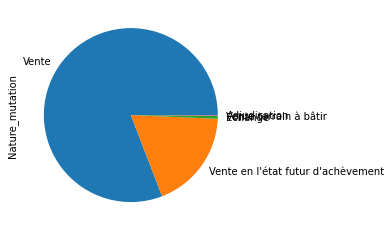

In [20]:
df_un_departement['Nature_mutation'].value_counts().plot.pie()

<AxesSubplot:ylabel='Valeur_fonciere'>

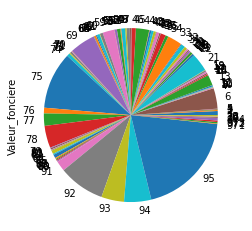

In [20]:
df_departement = df.groupby(['Code_departement'])
df_departement.Valeur_fonciere.sum()
df_departement.Valeur_fonciere.sum().plot.pie()

In [12]:
# color pallette
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

In [13]:
temp = df.groupby('Date_mutation').sum().reset_index()
#Nombre_pieces_principales
# adding two more columns
temp['Valeur foncière par mètre carré de terrain'] = round(temp['Valeur_fonciere']/temp['Surface_terrain'], 3)
temp['Valeur foncière par nombre de pièces principales'] = round(temp['Valeur_fonciere']/temp['Nombre_pieces_principales'], 3)

temp = temp.melt(id_vars='Date_mutation', value_vars=['Valeur foncière par mètre carré de terrain','Valeur foncière par nombre de pièces principales'], 
                 var_name='Ratio', value_name='Valeur')

fig = px.line(temp, x="Date_mutation", y="Valeur", color='Ratio', log_y=True, 
              title='Evolution de la valeur foncière par mètre carré de terrain', color_discrete_sequence=[dth,rec])
fig.show()

In [14]:
temp = df.groupby('Date_mutation')['Valeur_fonciere'].sum().reset_index()
temp = temp.melt(id_vars="Date_mutation", value_vars=['Valeur_fonciere'],
                 var_name='Variable', value_name='Valeur_fonciere')
temp.head()

fig = px.area(temp, x="Date_mutation", y="Valeur_fonciere", color='Variable',
             title='Valeur foncière en fonction du temps', color_discrete_sequence = [rec])
fig.show()

<ipython-input-14-7649795a38c4>:2: FutureWarning:

This dataframe has a column name that matches the 'value_name' column name of the resultiing Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.

